In [1]:
### This section MUST be run first

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from scipy.integrate import solve_ivp

T = np.transpose # Transpose operation
colourMap = plt.cm.magma

# Location of x
def Span(n,xspan):
    return np.linspace(xspan[0], xspan[1], num=n+1)

# 1-st Differentiation matrix
def First_Differentiation_Matrix(n,xspan):
# Input
#  n: grid number
#  xspan: [xmin,xmax]
# Output
#  Dx: The matrix representation of 1st differentiation
#      with order-2 accuracy
    a, b = xspan[0], xspan[1]
    h = (b-a)/n
    dp = +0.5*np.ones((n,1))
    dm = -0.5*np.ones((n,1))
    Dx = np.diagflat(dm,-1)+np.diagflat(dp,+1)
    Dx[0,0:3] = [-1.5, 2, -0.5]
    Dx[-1,-3:] = [+0.5, -2, +1.5]
    Dx /= h
    return Dx

# 2-nd Differentiation matrix
def Second_Differentiation_Matrix(n,xspan):
# Input
#  n: grid number
#  xspan: [xmin,xmax]
# Output
#  Dxx: The matrix representation of 2nd differentiation
#       with order-2 accuracy
    a, b = xspan[0], xspan[1]
    h = (b-a)/n
    d0 = -2*np.ones((n+1,1))
    dp = np.ones((n,1))
    Dxx = np.diagflat(dp,-1)+np.diagflat(d0)+np.diagflat(dp,+1)
    Dxx[0,0:4]  = [+2,-5,+4,-1]
    Dxx[-1,-4:] = [-1,+4,-5,+2]
    Dxx /= h**2
    return Dxx

class rectdisc:
    """Construct the rectangle domain"""
    def __init__(self,m,xspan,n,yspan):
        self.x   = Span(m,xspan) # Grid in x direction
        self.Dx  = First_Differentiation_Matrix(m,xspan)
        self.Dxx = Second_Differentiation_Matrix(m,xspan)
        self.y   = Span(n,yspan) # Grid in y direction
        self.Dy  = First_Differentiation_Matrix(n,yspan)
        self.Dyy = Second_Differentiation_Matrix(n,yspan)
        # Identity matrix which is compatiable in x and y direction
        self.Ix  = np.diagflat(np.ones((m+1,1)))
        self.Iy  = np.diagflat(np.ones((n+1,1)))
        # label the boundary
        self.isbndy = np.ones((m+1, n+1), dtype=bool)
        self.isbndy[1:-1,1:-1] = False
        # two-dimensional x-y grid
        self.X, self.Y = np.meshgrid(self.x,self.y)
        self.X = self.X.T 
        self.Y = self.Y.T
    
    def vec(self,M):
    # Input
    #  M: Matrix
    # Output
    #  Vecterization of M
        M = M.T.flatten()
        M = M[np.newaxis,:]
        return M.T
    
    def unvec(self,x):
    # Input
    #  x: Column vector
    # Output
    #  Reshape into a matrix column-wise
        x1,x2 = np.shape(x)
        x = x.T
        x = x.reshape(n+1,m+1)
        return x.T

In [2]:
# Solving Poisson equation by finite differences

def PoissonFD(f,g,m,xspan,n,yspan):
# f: forcing function
# g: boundary condition
    # Initialization
    Rect = rectdisc(m,xspan,n,yspan)
    
    # Laplcian matrix
    A = np.kron(Rect.Iy,Rect.Dxx) + np.kron(Rect.Dyy,Rect.Ix)
    
    # Vecterization
    b = Rect.vec(f(Rect.X,Rect.Y))
    
    # Scale is used to lower the condition number
    scale = max(abs(A[-1,:]))
    x1, x2 = np.shape(A)
    I = np.eye(x1)
    for i in range(x1):
        bndyVec = Rect.vec(Rect.isbndy)
        Xvec = Rect.vec(Rect.X)
        Yvec = Rect.vec(Rect.Y)
        if bndyVec[i] == True:
            A[i,:] = scale*I[i,:]
            b[i,:] = scale*g( Xvec[i], Yvec[i])
    
    # Solve the linear system and reshape the output
    u = np.linalg.solve(A,b)
    U = Rect.unvec(u)
    return U, Rect.X, Rect.Y

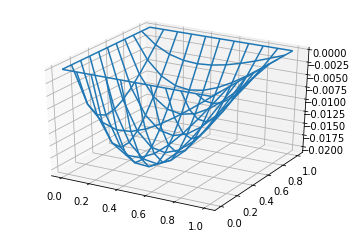

In [3]:
### Solve Poisson Equation

# forcing function
def f(x,y):
    #return np.sin(x)
    return (1-x)*(1-y)

# boundary condition
def g(x,y):
    #return np.sin(x)
    return 0

# Grid
m,xspan,n,yspan = 10,[0,1],10,[0,1]

# Solve
U,X,Y = PoissonFD(f,g,m,xspan,n,yspan)

# Plot
fig = plt.figure()
ax = fig.gca(projection='3d')
Axes3D.plot_wireframe(ax,X, Y, U)
SaveLoc = SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Poission Equation\\Poission.png'
fig.savefig(SaveLoc, bbox_inches='tight')

In [4]:
# Solving diffusion equation by finite differences
def DiffusionFD(U,g,t,m,xspan,n,yspan):
# Input
#  U: current state (matrix)
#  g: boundary condition (not used)
#  t: timestep
# Output
#  U1: The next state

    # Initialization
    Rect = rectdisc(m,xspan,n,yspan)
    
    # Construct diffusion matrix
    A = np.kron(Rect.Iy,Rect.Dxx) + np.kron(Rect.Dyy,Rect.Ix)
    i,j = np.shape(A)
    Ixy = np.eye(i)
    A = (t*A+Ixy)
    
    # vecterization
    b = Rect.vec(U)
    U1 = Rect.unvec(np.matmul(A,b))
    
    return U1, Rect.X, Rect.Y

In [5]:
# Define function to save image for Diff eq.
    
def save2dim(U,TickLevel,SaveLoc):
    fig, ax = plt.subplots()
    plt.axis('off')
    plt.imshow(U,vmin=TickLevel.min(), vmax=TickLevel.max(),
               cmap=colourMap,interpolation='bicubic',origin='lower',
               extent=[X.min(), X.max(), Y.min(), Y.max()])
    plt.colorbar()
    plt.show()
    fig.savefig(SaveLoc, bbox_inches='tight')
    
def save3dim(X,Y,U,SaveLoc):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    Axes3D.plot_surface(ax,X, Y, U,cmap=plt.cm.magma,animated=True)
    ax.set_zlim(0,1)
    fig.savefig(SaveLoc, bbox_inches='tight')
    return 

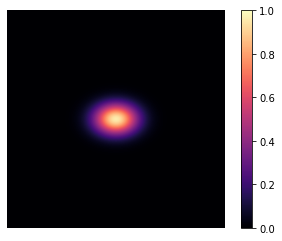

10


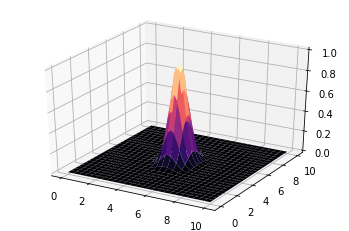

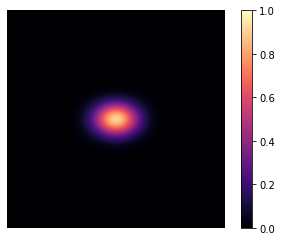

20


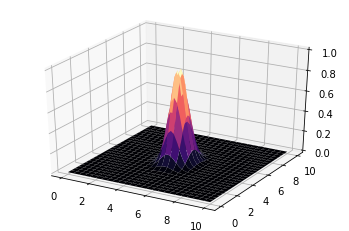

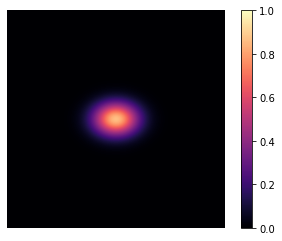

30


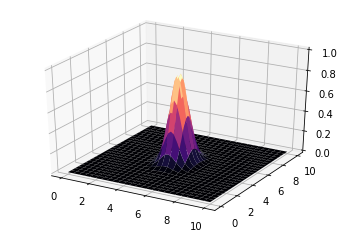

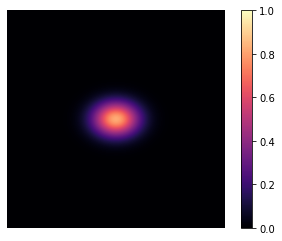

40


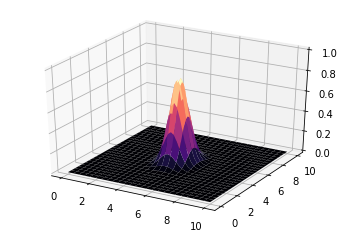

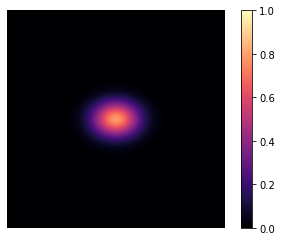

50


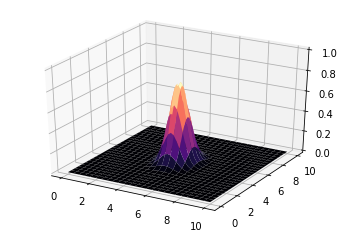

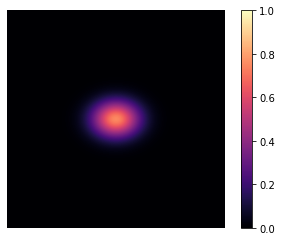

60


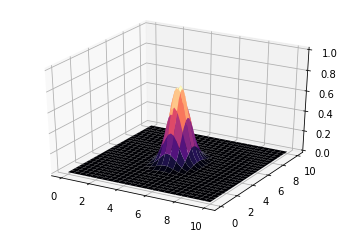

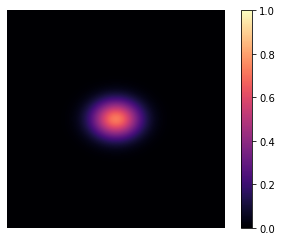

70


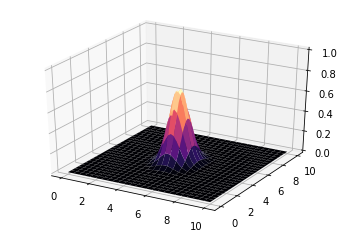

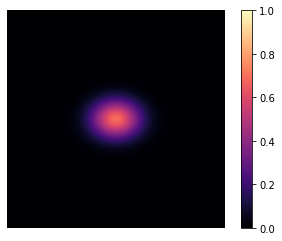

80


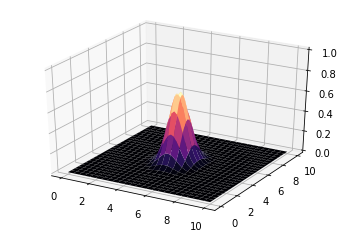

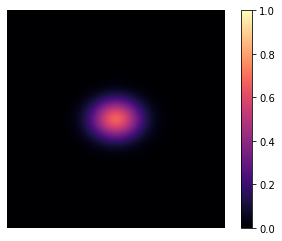

90


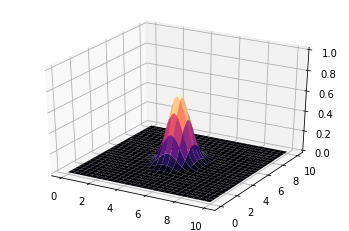

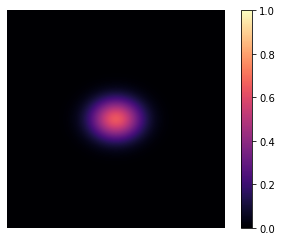

100


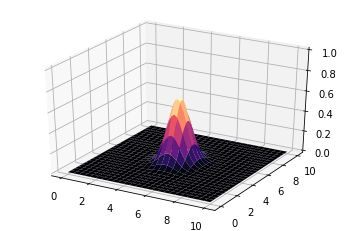

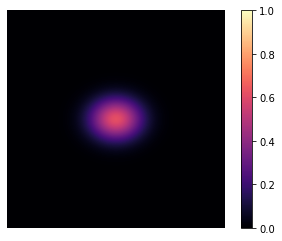

110


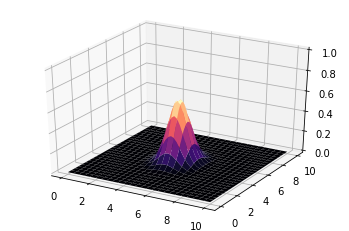

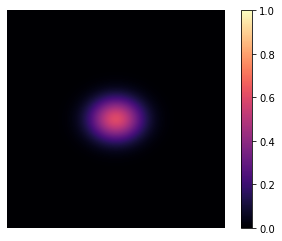

120


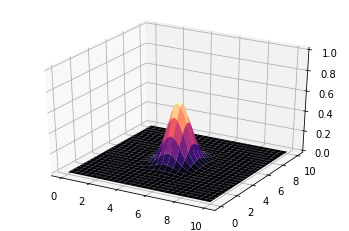

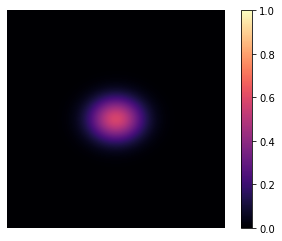

130


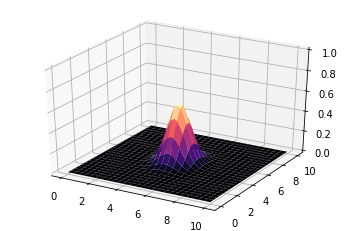

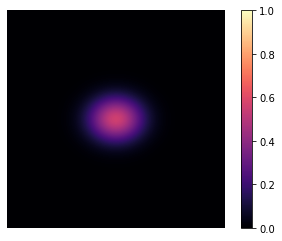

140


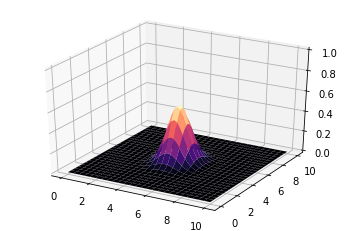

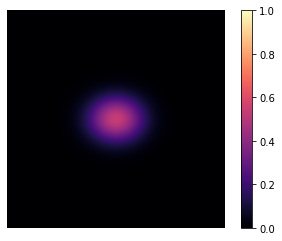

150


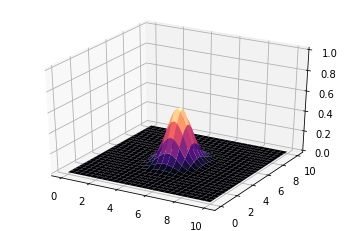

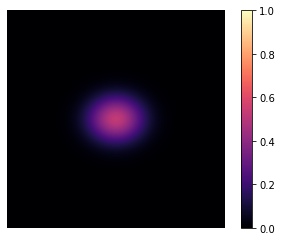

160


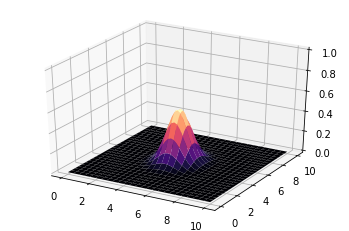

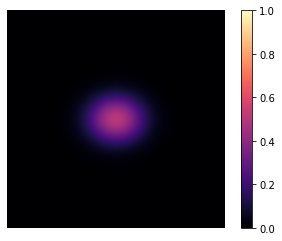

170


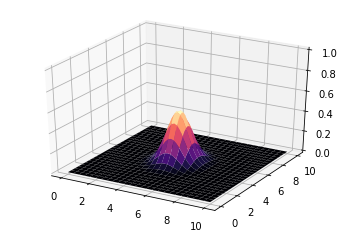

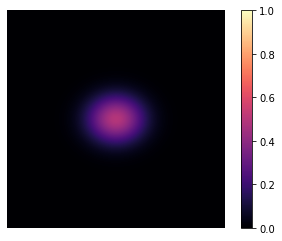

180


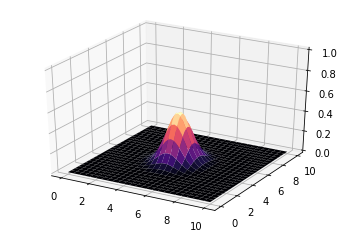

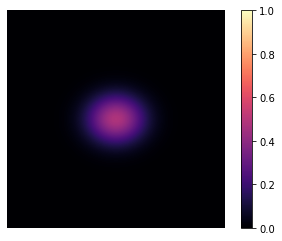

190


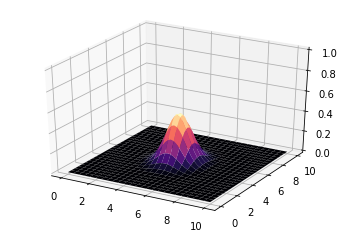

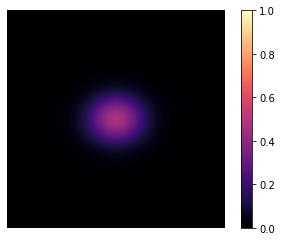

200


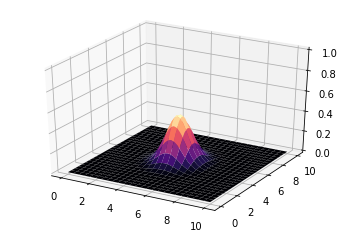

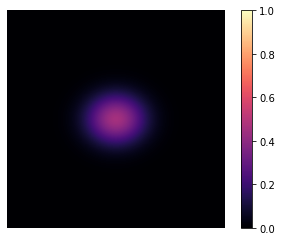

210


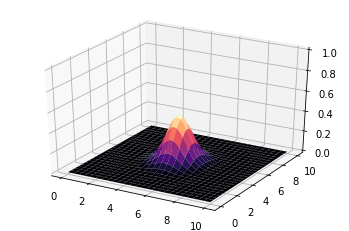

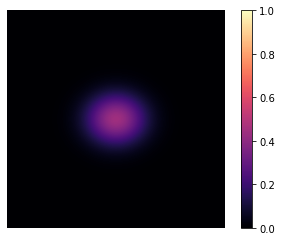

220


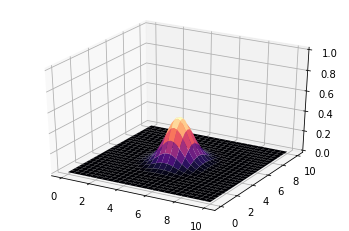

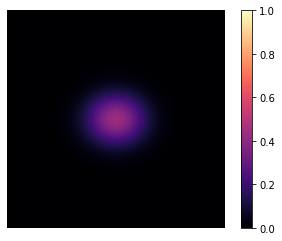

230


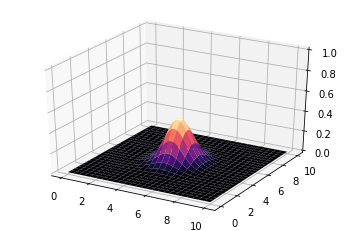

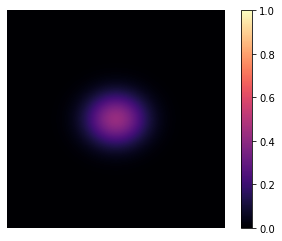

240


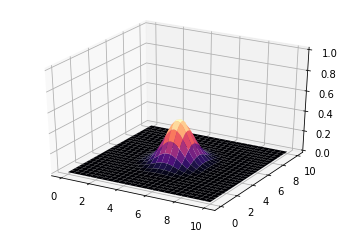

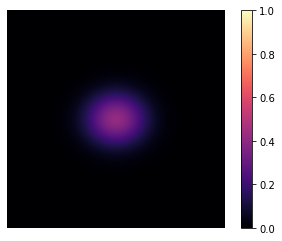

250


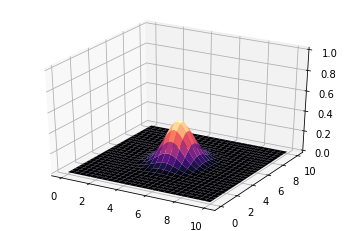

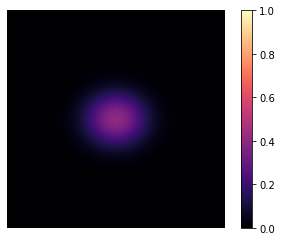

260


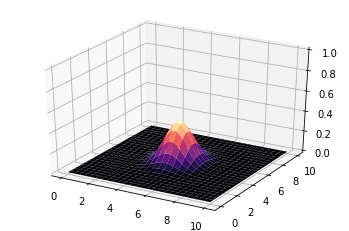

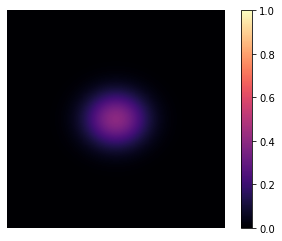

270


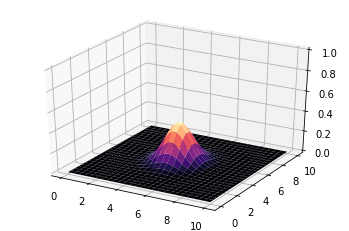

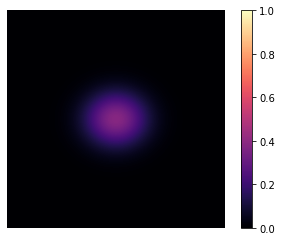

280


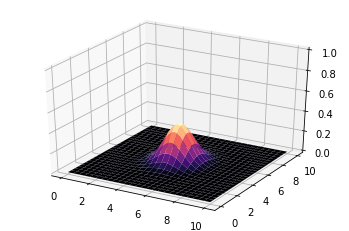

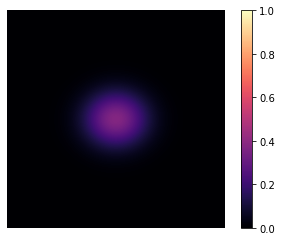

290


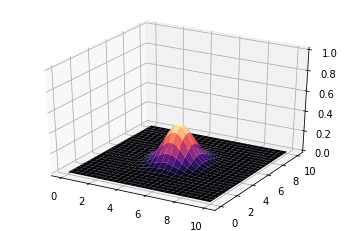

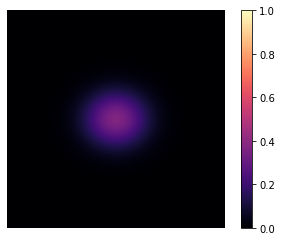

300


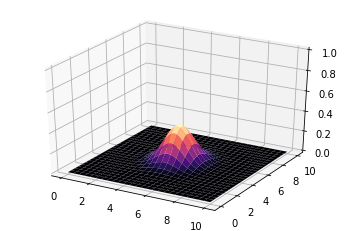

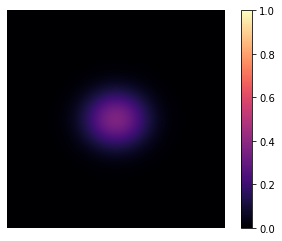

310


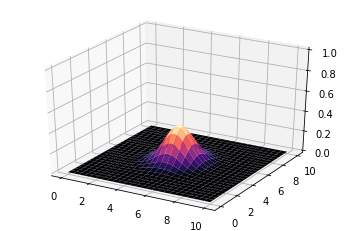

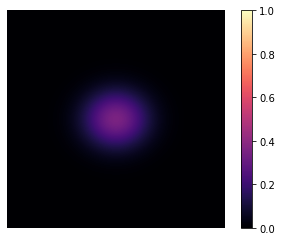

320


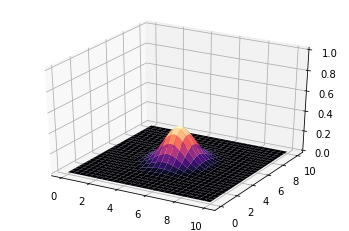

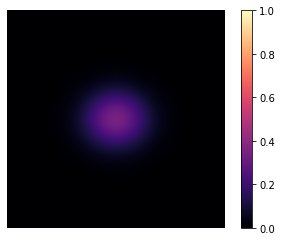

330


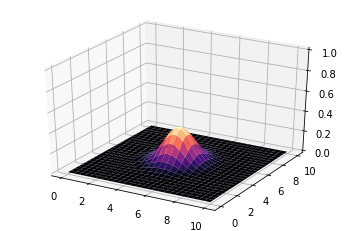

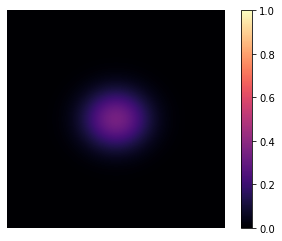

340


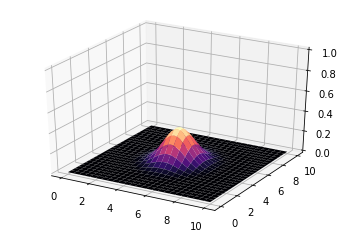

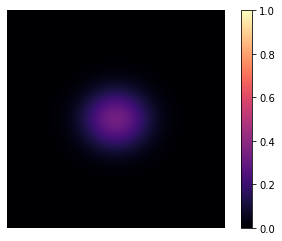

350


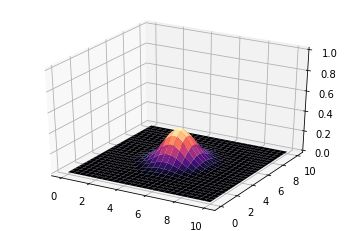

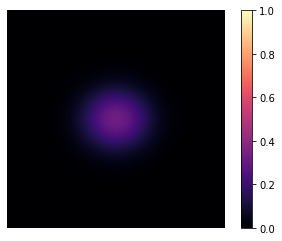

360


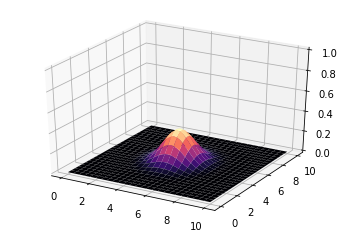

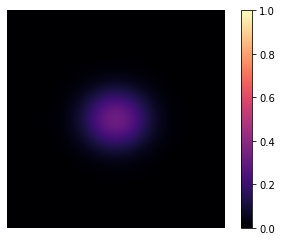

370


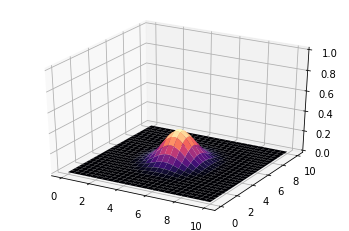

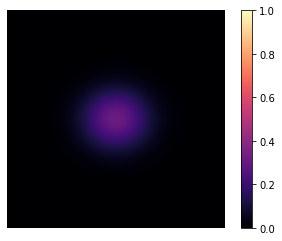

380


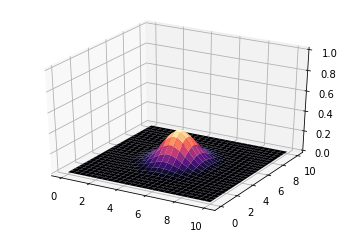

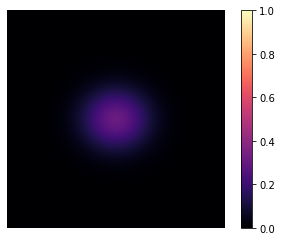

390


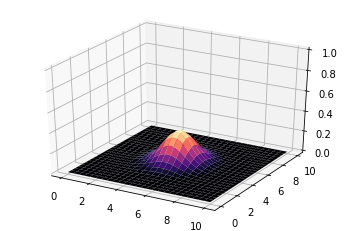

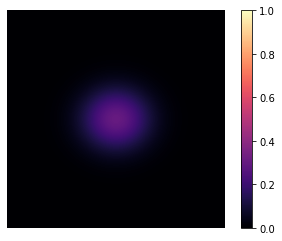

400


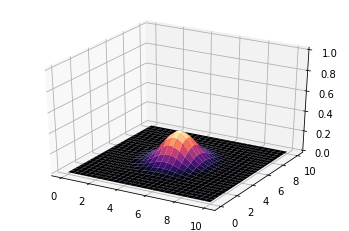

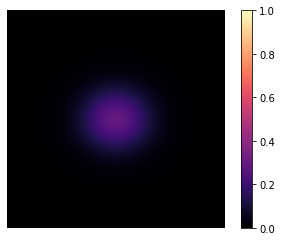

410


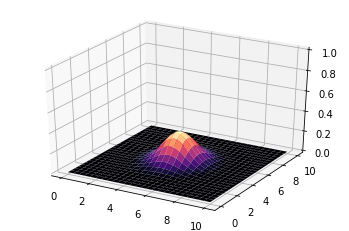

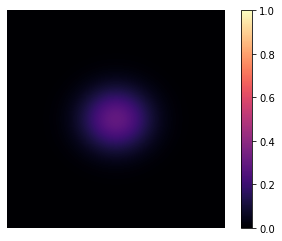

420


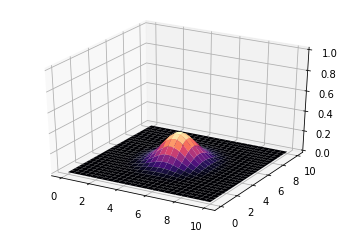

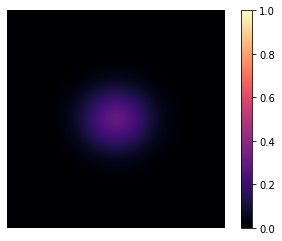

430


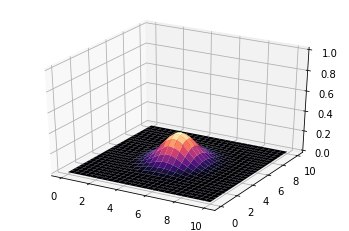

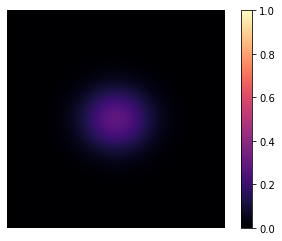

440


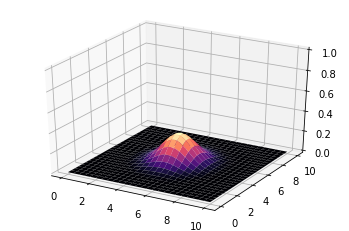

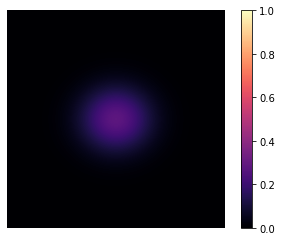

450


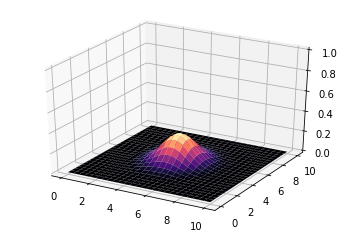

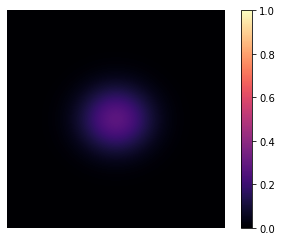

460


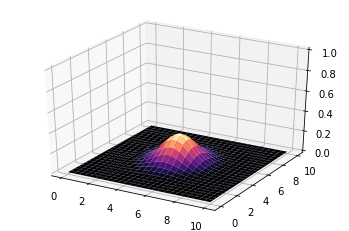

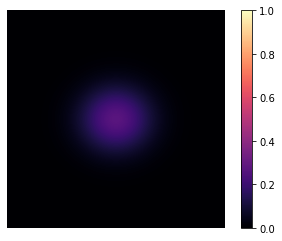

470


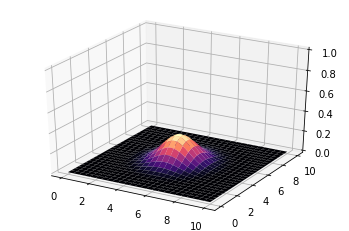

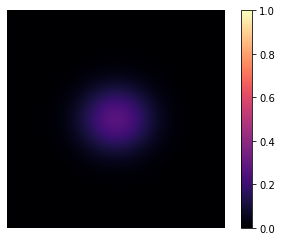

480


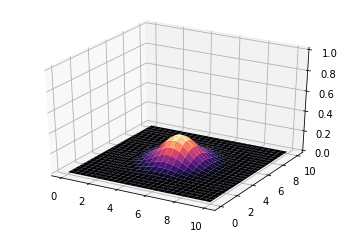

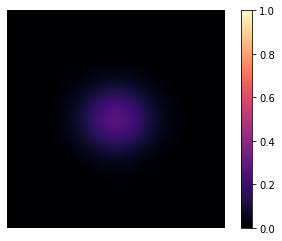

490


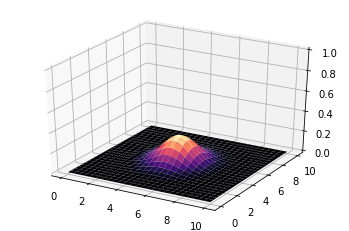

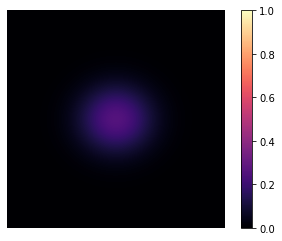

500


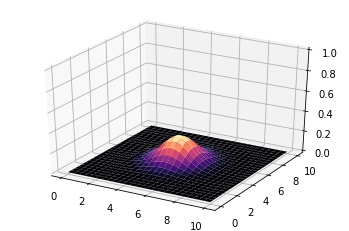

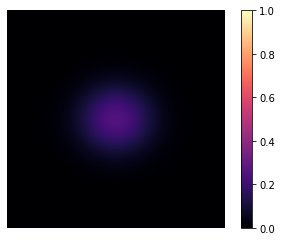

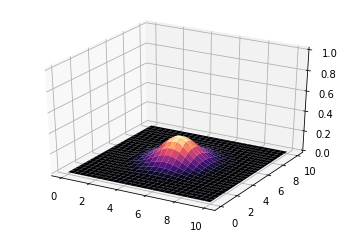

In [6]:
### Solve diffusion Equation

# boundary condition
def g(x,y):
    return 0

# Grid
m,xspan,n,yspan = 50,[0,10],50,[0,10]

# function of initial state
def f(x,y):
    return np.exp(-(2*(x-5)**2+(y-5)**2))
Rect = rectdisc(m,xspan,n,yspan)
X, Y = Rect.X, Rect.Y
U0 = f(X, Y)

# Time initializationfor iteration
t = 0.001 # Time step
tmin = 0   # Start time
tmax = 500 # End time
timespan = np.arange(tmin,tmax+1)

# Simulation
t_trace = 10 # interval of saving image
TickLevel = np.arange(0,1.1,0.1)
for i in timespan:
    if i == 0:
        SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Diffusion Equation\\2D contour\\t{i}.png'
        save2dim(U0,TickLevel,SaveLoc)
        SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Diffusion Equation\\3D plot\\t{i}.png'
        save3dim(X,Y,U0,SaveLoc)
    else:
        # Solve
        U0, X, Y = DiffusionFD(U0,g,t,m,xspan,n,yspan)
        if np.isclose(i%t_trace,0):
            print(i)
            SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Diffusion Equation\\2D contour\\t{i}.png'
            save2dim(U0,TickLevel,SaveLoc)            
            SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Diffusion Equation\\3D plot\\t{i}.png'
            save3dim(X,Y,U0,SaveLoc)
            


C:\Users\Justin Lien\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Justin Lien\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


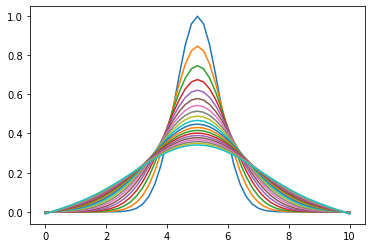

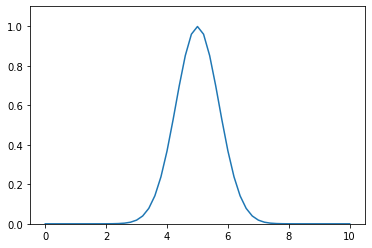

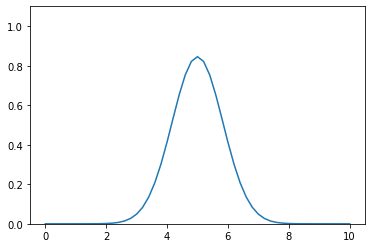

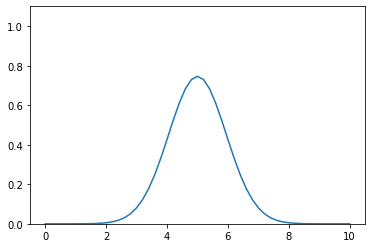

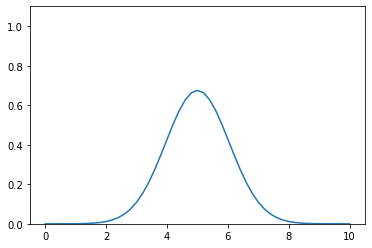

...

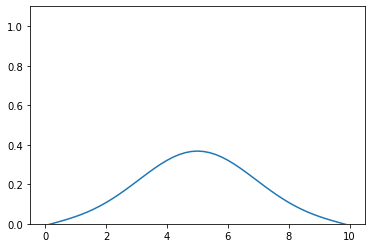

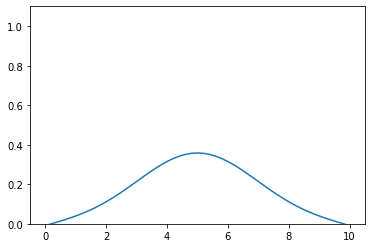

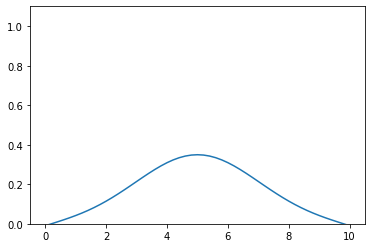

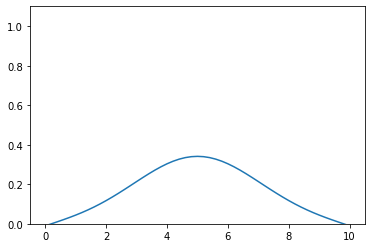

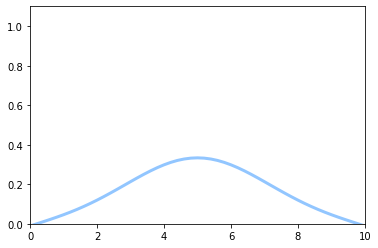

In [7]:
# Solve 1-dim diffusion equation

# Grid
m,xspan,n,yspan = 50,[0,10],50,[0,10]

# Initialization of domain (Note: only use x direction)
Rect = rectdisc(m,xspan,n,yspan)
Domain = np.linspace(xspan[0],xspan[1],m+1)

# Transpose a 1-dim row vector into a 2-dim column vector
def T_1dim_vec(w):
    return w[np.newaxis,:].T

# Boundary condition
Ai, Af = 0, 0

# Initial state
def f(x):
    return np.exp(-(x-(xspan[0]+xspan[1])/2)**2)
y = T_1dim_vec(f(Domain))

# Solve diffusion equation
Y = []
Y.append(y) # Recorder
dt = 0.001
StartCounter, EndCounter = 0, 2000
Tspan = np.arange(StartCounter, EndCounter)
ShowInterval = 100
fig = plt.figure('holdon')
for i in Tspan:
    # Iteration
    y = np.matmul(dt*Rect.Dxx+np.eye(m+1),y)
    Y.append(y)
    if i%ShowInterval == 0:
        # Plot for overlapping
        fig = plt.figure('holdon')
        plt.plot(Domain,y)
        # Plot and save for each step
        fig1 = plt.figure()
        plt.plot(Domain,y)
        plt.ylim(0,1.1)
        SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Diffusion Equation\\1d plot\\1d_t{i}.png'
        fig1.savefig(SaveLoc, bbox_inches='tight')
        
# Save for overlapping
fig = plt.figure('holdon')
SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Diffusion Equation\\1d plot\\1d_holdon.png'
fig.savefig(SaveLoc, bbox_inches='tight')


# Generate gif
# I don't know why but in this section gif maker works?????

plt.style.use('seaborn-pastel')

fig = plt.figure()
ax = plt.axes(xlim=(0,10), ylim=(0,1.1))
line, = ax.plot([], [], lw=3)

def init():
    line.set_data([], [])
    return line,
def animate(i):
    line.set_data(Domain, np.squeeze(Y[i]))
    return line,

anim = FuncAnimation(fig, animate, init_func=init,
                               frames=2000, interval=20, blit=True)
SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Diffusion Equation\\1d plot\\1d.gif'
anim.save(SaveLoc, writer='imagemagick')

In [8]:
# Define function to save image for Adv-Diff eq.

def save2dim(U,TickLevel,SaveLoc):
    fig, ax = plt.subplots()
    plt.axis('off')
    plt.imshow(U,vmin=TickLevel.min(), vmax=TickLevel.max(),
               cmap=colourMap,interpolation='bicubic',origin='lower',
               extent=[X.min(), X.max(), Y.min(), Y.max()])
    plt.colorbar()
    plt.show()
    fig.savefig(SaveLoc, bbox_inches='tight')
    
def save3dim(X,Y,U,SaveLoc):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    Axes3D.plot_surface(ax,X, Y, U,cmap=plt.cm.magma,animated=True)
    ax.set_xticks([-1,-0.5,0,0.5,1])
    ax.set_yticks([-1,-0.5,0,0.5,1])
    ax.set_zlim(0,1.6)
    plt.show()
    fig.savefig(SaveLoc, bbox_inches='tight')

0


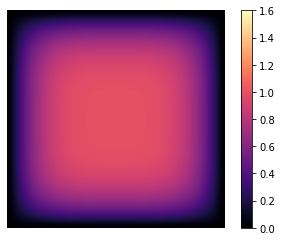

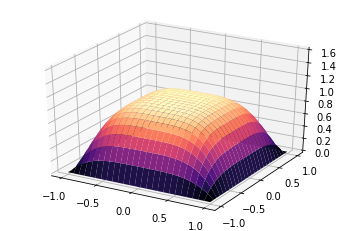

11


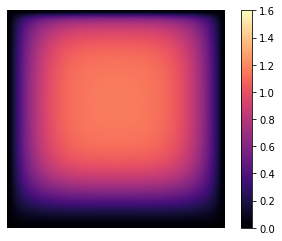

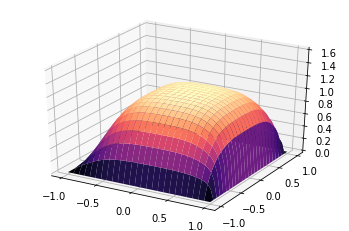

23


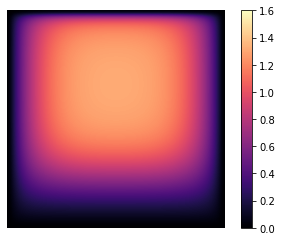

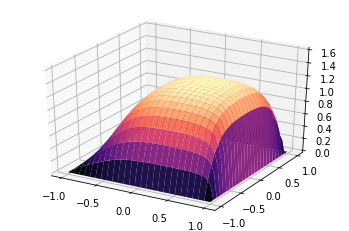

35


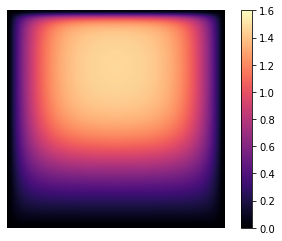

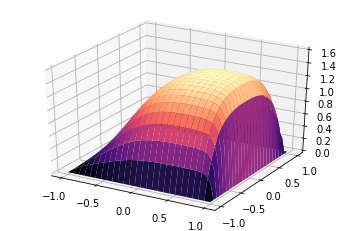

46


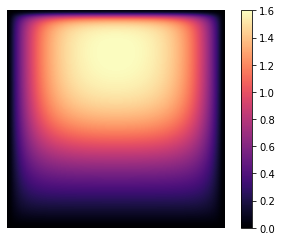

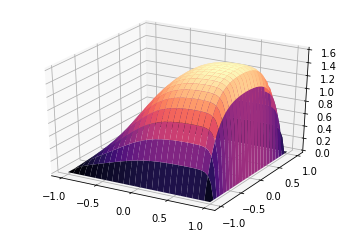

58


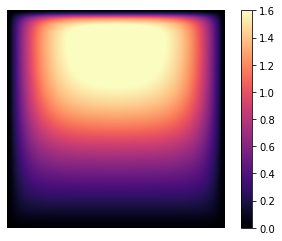

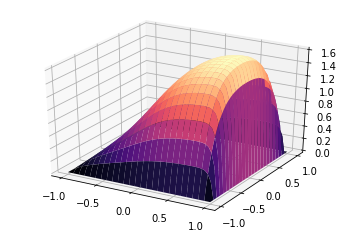

70


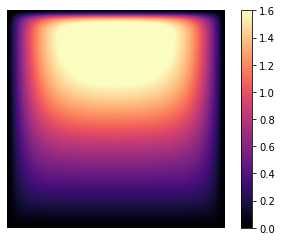

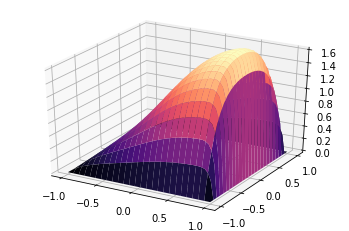

82


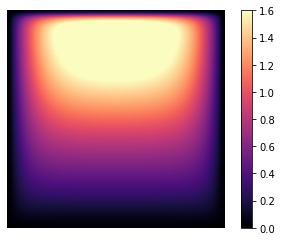

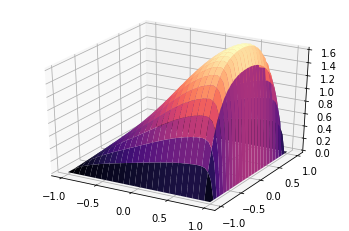

93


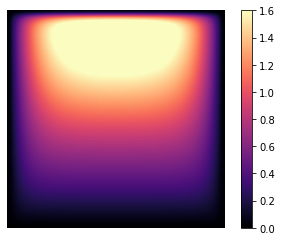

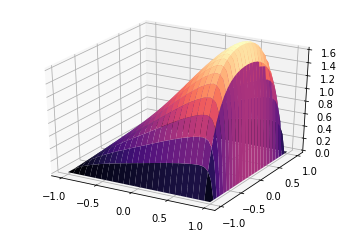

105


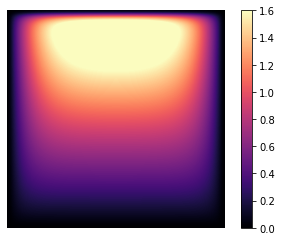

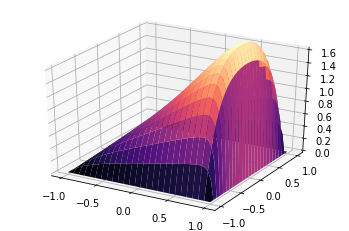

117


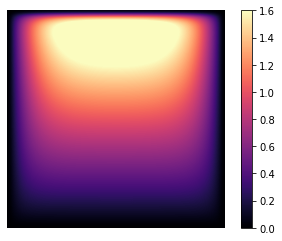

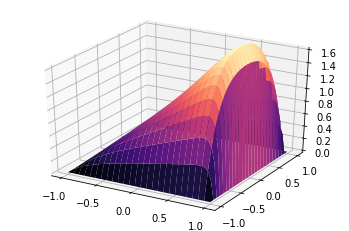

129


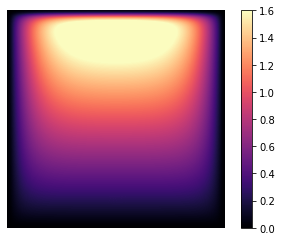

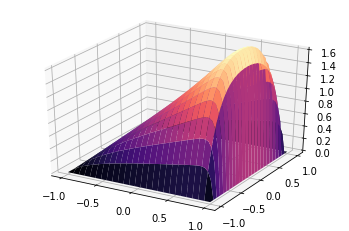

140


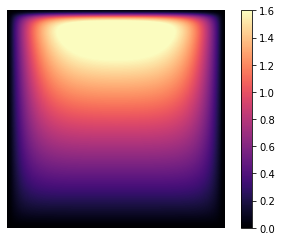

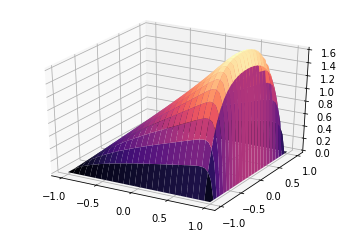

152


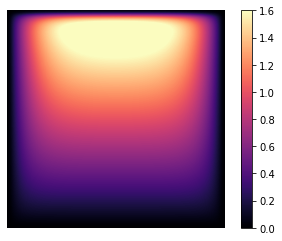

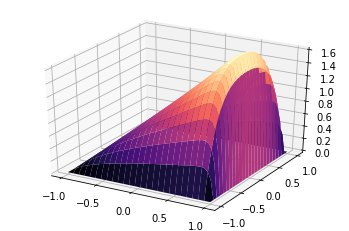

164


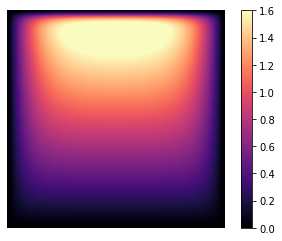

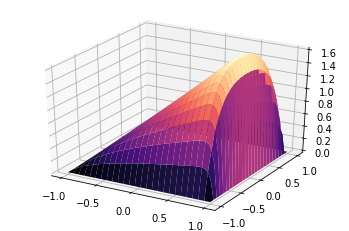

176


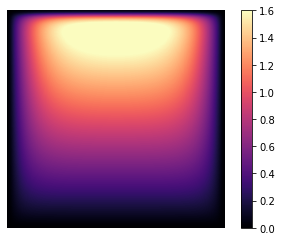

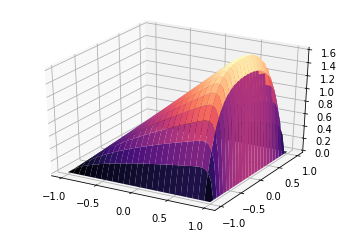

187


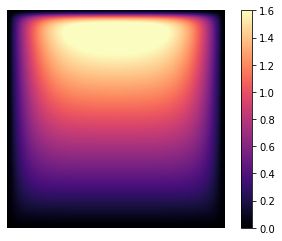

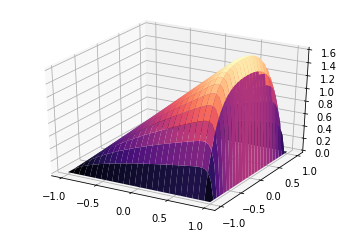

199


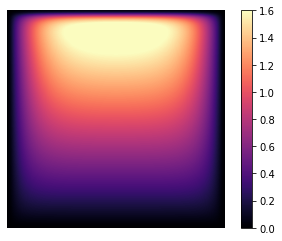

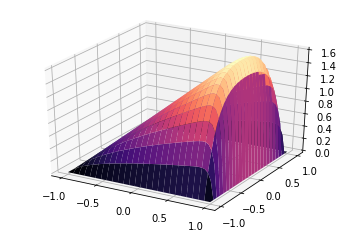

211


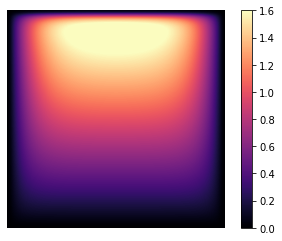

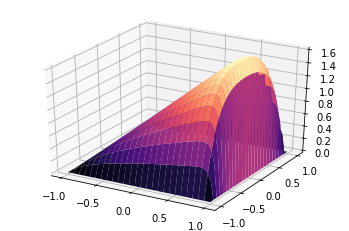

223


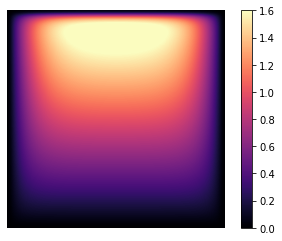

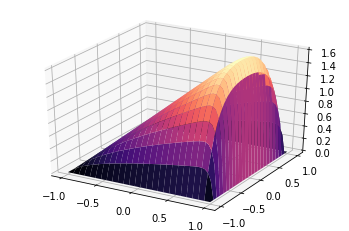

In [9]:
# Advection-Diffusion Equation

# Grid
m,xspan,n,yspan = 50,[-1,+1],50,[-1,+1]
Rect = rectdisc(m,xspan,n,yspan)
X, Y = Rect.X, Rect.Y

# Boundary condition (is set to be the same as initial condition)
def g(x,y):
    return (1-x**4)*(1-y**4)

# Initial condition
U0 = g(X,Y)

# Vecterization with fixed boundary
def unpack(w):
    # Input: Column vector
    U = U0 # Keep boundary
    w = w.T
    w = w.reshape(n-1,m-1)
    w = w.T
    U[1:-1,1:-1] = w # Overwrite interior
    return U # Matrix

def pack(U):
    # Input: Matrix
    w = U[1:-1,1:-1] # Get interior
    w = w.T.flatten()
    w = w[np.newaxis,:]
    return w.T # Column vector
    
def timederiv(t,w):
    # Convert input row vector into a column vector
    if w.ndim == 1:
        w = w[np.newaxis,:].T
    else:
        print(w.ndim)
        x1,x2 = np.shape(w)
        if x2 >1:
            w = w[0,:]
            w = w[np.newaxis,:].T
    # Solve the next step by differentiation matrices
    U = unpack(w)
    Uxx,Uyy = np.matmul(Rect.Dxx,U),np.matmul(U,Rect.Dyy.T)
    dUdt = 1 - np.matmul(Rect.Dx,U) + 0.05*(Uxx+Uyy)
    dwdt = pack(dUdt)
    return dwdt.squeeze() # Output as a row vector

# Solve differential equation
sol = solve_ivp(timederiv, [0,3], pack(U0).squeeze())

# Check the return time-series
x1 = np.shape(sol.t)
x1 = x1[0]

TickLevel = np.arange(0,1.61,0.2)

# Plot the results
for i in np.linspace(0,x1-1,20):
    print(int(np.fix(i)))
    SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Advection Diffusion Equation\\2d contour\\t{int(1000*i)}.png'
    save2dim(unpack(sol.y[:,int(np.fix(i))]),TickLevel,SaveLoc)
    SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Advection Diffusion Equation\\3d plot\\t{int(1000*i)}.png'
    save3dim(X,Y,unpack(sol.y[:,int(np.fix(i))]),SaveLoc)

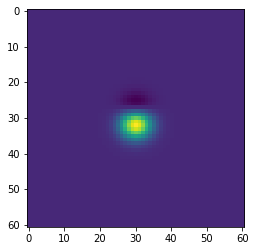

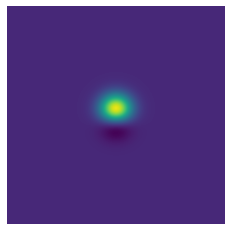

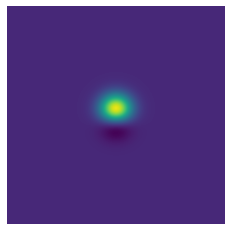

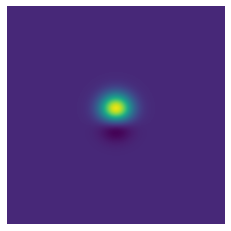

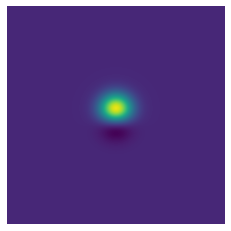

...

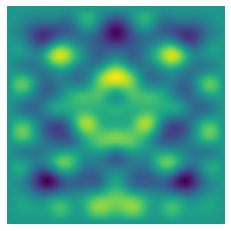

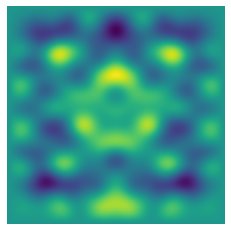

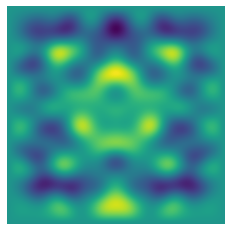

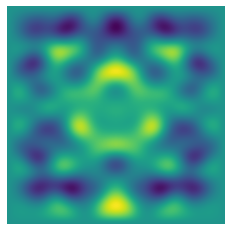

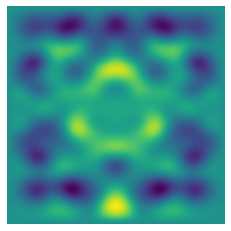

In [10]:
# Wave Equation (Reflecting Wall)

# Grid
m,xspan,n,yspan = 60,[-2,+2],60,[-2,+2]
Rect = rectdisc(m,xspan,n,yspan)
X, Y = Rect.X, Rect.Y

# Initial state
U0 = (X+0.2)*np.exp(-12*(X**2+Y**2)) # Interior
V0 = 0*U0 # Boundary

plt.imshow(U0)
plt.show()

def intoColumn(w):
    # Input a 1-dim row vector w
    # Output a 2-dim column vector
    if w.ndim == 1:
        w = w[np.newaxis,:].T
    return w
    
def reshapeColumn(A,m,n):
    # Input a column vec and reshape columnwise
    return A.reshape(n,m).T

def reshapeVec(A):
    m,n = np.shape(A)
    A = A.T
    return A.reshape(m*n,1)

# vec-> two matrices (interior+boundary)
def unpack(w):
    w = intoColumn(w)
    numU = (m-1)*(n-1) # Number of interior
    # Interior
    U = U0
    Int = w[0:numU]
    U[1:-1,1:-1] = reshapeColumn(Int,m-1,n-1)
    # Boundary
    V = Rect.unvec(w[numU:])
    return U,V

# Two matrices -> vec
def pack(U,V):
    w = U[1:-1,1:-1]
    w = reshapeVec(w)
    v = reshapeVec(V)
    w = np.vstack((w,v))
    return w.squeeze()

# Time-derivative
def timederiv(t,w):
    w = intoColumn(w)
    U,V = unpack(w)
    dUdt = V
    dWdt = np.matmul(Rect.Dxx,U)+np.matmul(U,Rect.Dyy.T)
    dwdt = pack(dUdt,dWdt)
    return dwdt.squeeze()

v0 = pack(U0,V0)
sol = solve_ivp(timederiv, [0,10], v0, method='RK45')

# Check the return time-series
x1 = np.shape(sol.t)
x1 = x1[0]

# Save for gif
#ims = []

# Plot the results
for i in range(x1):
    idx = int(np.fix(i))
    U, A = unpack(np.squeeze(sol.y[:,idx]))
    fig, ax = plt.subplots()
    plt.axis('off')
    im = plt.imshow(U,interpolation='bicubic',origin='lower',
                   extent=[X.min(), X.max(), Y.min(), Y.max()])
    #ims.append([im])
    plt.show()
    SaveLoc = SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Wave Equation\\Reflection\\Ref{i}.png'
    fig.savefig(SaveLoc, bbox_inches='tight')

In [11]:
# Save gif for Wave Equation (Reflecting Wall)

#fps = 30
#nSeconds = 5
#snapshots = []
#for idx in range(x1):
#    U, A = unpack(np.squeeze(sol.y[:,idx]))
#    snapshots.append(U)

#fig, ax = plt.subplots()
#plt.axis('off')
#Udata = []
#im = plt.imshow(snapshots[0],interpolation='bicubic',origin='lower',
#                   extent=[X.min(), X.max(), Y.min(), Y.max()],animated=True)


#def animate(frame):
#    U, A = unpack(np.squeeze(sol.y[:,frame]))
#    Udata.append(U)
#    im.set_data(snapshots[frame])
#    return [im]

#anim = animation.FuncAnimation(fig,  animate,  frames = nSeconds * fps, repeat = True,
#                                 interval = 1000 / fps, blit=True, repeat_delay=1000)

#SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Wave Equation\\ReflectingWall.gif'
#anim.save(SaveLoc,writer='imagemagick')

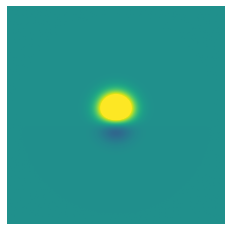

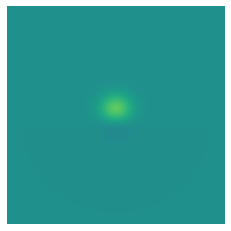

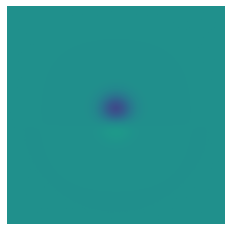

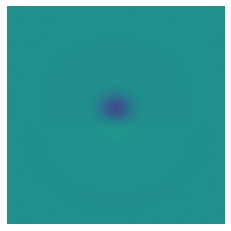

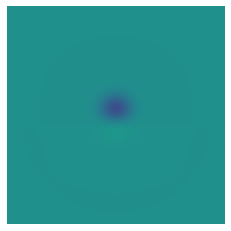

...

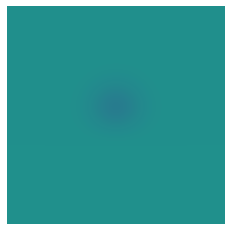

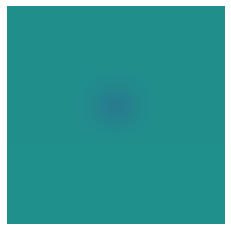

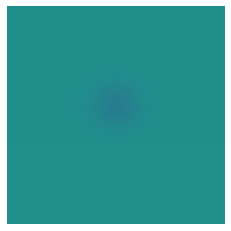

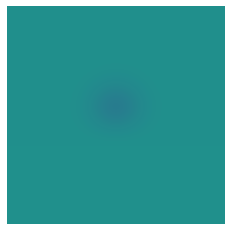

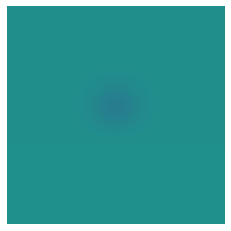

It is done!


In [12]:
# Wave Equation version 2 (Absorbing wall)

# Grid
m,xspan,n,yspan = 60,[-2,+2],60,[-2,+2]
Rect = rectdisc(m,xspan,n,yspan)
X, Y = Rect.X, Rect.Y

# Initial state
U0 = (X+0.2)*np.exp(-12*(X**2+Y**2)) # Interior
V0 = 0*U0 # Boundary

U = []
U.append(U0)
U.append(0.60*U0)

def WaveFD(dt,Ut1,Ut2):
    # Input the current state and the previous state
    # Output the next state
    A = V0 # Fix boundary
    Uxx = np.matmul(Rect.Dxx,Ut1)
    Uyy = np.matmul(Ut1,Rect.Dyy.T)
    A1 = (dt**2)*( Uxx+Uyy ) + 2*Ut1 - Ut2
    A[1:-1,1:-1] = A1[1:-1,1:-1] # Update interior
    return A

dt = 0.01
tmin, tmax = 0, 400
timespan = range(tmin+2,tmax+1)

# Plot initial state
fig, ax = plt.subplots()
plt.axis('off')
plt.imshow(U0,interpolation='bicubic',origin='lower',vmin = -0.1, vmax = 0.1,
           extent=[X.min(), X.max(), Y.min(), Y.max()])
plt.show()
SaveLoc = SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Wave Equation\\Absorption\\Abs0.png'
fig.savefig(SaveLoc, bbox_inches='tight')

# Iteration
for i in timespan:
    Unew = WaveFD(dt,U[i-1],U[i-2])
    U.append(Unew)
    # Plot
    if i%2 == 0:
        fig, ax = plt.subplots()
        plt.axis('off')
        plt.imshow(Unew,interpolation='bicubic',origin='lower',vmin = -0.1, vmax = 0.1,
                   extent=[X.min(), X.max(), Y.min(), Y.max()])
        plt.show()
        SaveLoc = SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Wave Equation\\Absorption\\Abs{i}.png'
        fig.savefig(SaveLoc, bbox_inches='tight')
        
print('It is done!')

In [13]:
# Save gif for Wave Equation (Absorbing Wall)

#fps = 30
#nSeconds = 5
#snapshots = U

#fig, ax = plt.subplots()
#plt.axis('off')
#Udata = []
#im = plt.imshow(snapshots[0],interpolation='bicubic',origin='lower',
#                   extent=[X.min(), X.max(), Y.min(), Y.max()],animated=True)


#def animate(frame):
#    #U, A = unpack(np.squeeze(sol.y[:,frame]))
#    #Udata.append(U)
#    im.set_data(snapshots[frame])
#    return [im]

#anim = animation.FuncAnimation(fig,  animate,  frames = nSeconds * fps, repeat = True,
#                                 interval = 1000 / fps, blit=True, repeat_delay=1000)
#SaveLoc = f'C:\\Users\\Justin Lien\\Desktop\\NTU Senior\\Computer Programming\\Final Project\\Wave Equation\\AbsorbingWall.gif'
#anim.save(SaveLoc,writer='imagemagick')